# Demo Notebook for COCOA dataset

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)]((https://colab.research.google.com/github.com/shunk031/huggingface-datasets_COCOA/blob/add-demo-notebook/notebooks/COCOA_demo.ipynb))



In [1]:
from typing import Optional, Sequence

import datasets as ds
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.axes import Axes
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
from pycocotools import mask as cocomask

In [2]:
def show_mask(mask_rle, ax: Axes, color: Optional[Sequence[int]] = None) -> Axes:
    """Function inspired by Wakeupbuddy/amodalAPI's `showMask` function

    https://github.com/Wakeupbuddy/amodalAPI/blob/master/PythonAPI/pycocotools/amodal.py#L154-L173
    """
    color = color or (0, 1, 0)
    mask_arr = cocomask.decode([mask_rle])
    image = np.ones((mask_arr.shape[0], mask_arr.shape[1], 3))

    boundary = np.zeros((mask_arr.shape[0], mask_arr.shape[1]))
    for aa in range(mask_arr.shape[0] - 1):
        for bb in range(mask_arr.shape[1] - 1):
            if mask_arr[aa, bb] != mask_arr[aa, bb + 1]:
                boundary[aa, bb], boundary[aa, bb + 1] = 1, 1
            if mask_arr[aa, bb] != mask_arr[aa + 1, bb]:
                boundary[aa, bb], boundary[aa + 1, bb] = 1, 1
            if mask_arr[aa, bb] != mask_arr[aa + 1, bb + 1]:
                boundary[aa, bb], boundary[aa + 1, bb + 1] = 1, 1

    for i in range(len(color)):
        image[:, :, i] = color[i]
        ax.imshow(np.dstack((image, boundary * 1)))
        ax.imshow(np.dstack((image, mask_arr * 0.3)))
    return ax

In [3]:
def show_amodal_annotations(data, ax: Axes) -> Axes:
    """Function inspired by Wakeupbuddy/amodalAPI's `showAmodalAnns` function

    https://github.com/Wakeupbuddy/amodalAPI/blob/master/PythonAPI/pycocotools/amodal.py#L98-L124
    """
    image = data["image"]
    ax.imshow(image)
    ax.axis("off")

    regions = data["annotations"]["regions"]
    for region in regions:
        seg_maps = region["segmentation"]

        colors = []
        polygons = []
        for seg_map in reversed(seg_maps):
            if not isinstance(seg_map, list):
                raise NotImplementedError

            color = np.random.random((3,))
            colors.append(color)

            poly = np.array(seg_map).reshape(len(seg_map) // 2, 2)
            polygons.append(Polygon(poly, closed=True, alpha=0.1))

        patch_collection = PatchCollection(
            polygons,
            facecolors=colors,
            edgecolors=(0, 0, 0, 1),
            linewidths=3,
            alpha=0.8,
        )
        ax.add_collection(patch_collection)
    return ax

In [4]:
def show_amodal_instance(
    data, ax: Axes, k: int = -1, color: Optional[Sequence[int]] = None
) -> Axes:
    """Function inspired by Wakeupbuddy/amodalAPI's `showAmodalInstance` function

    https://github.com/Wakeupbuddy/amodalAPI/blob/master/PythonAPI/pycocotools/amodal.py#L175-L209
    """
    color = color or [0, 1, 0]  # green

    image = data["image"]

    ax.imshow(image)
    ax.axis("off")

    assert len(data["annotations"]["regions"]) == 1
    (region,) = data["annotations"]["regions"]

    seg_maps = region["segmentation"]
    seg_map = seg_maps[k - 1]

    if k < 0:
        return show_mask(seg_map, ax=ax)

    if isinstance(seg_map, list):
        poly = np.array(seg_map).reshape(len(seg_map) // 2, 2)
        patch_collection = PatchCollection(
            patches=[Polygon(poly, closed=True, alpha=0.2)],
            facecolors=[color],
            edgecolors=(1, 1, 1, 1),
            linewidths=3,
            alpha=0.2,
        )
        ax.add_collection(patch_collection)
    else:
        ax = show_mask(seg_map, ax=ax)

    invisible_masks = region["invisible_mask"]
    invisible_mask = invisible_masks[k - 1]

    if invisible_mask:
        ax = show_mask(invisible_mask, ax=ax, color=(1, 0, 0))

    return ax

In [5]:
dataset = ds.load_dataset(
    path="shunk031/COCOA",
    name="COCO",
    data_dir="./annotations.tar.gz", # download from the author's google drive
    decode_rle=False
)

In [6]:
def get_hotdog_example(dataset, image_id: int = 327590):
    val_dataset = dataset["validation"]

    filtered_data = val_dataset.filter(lambda example: example["image_id"] == image_id)
    assert len(filtered_data) == 1
    return filtered_data[0]

# For compatibility with amodalAPI demo notebooks
# https://github.com/Wakeupbuddy/amodalAPI/blob/master/PythonAPI/myAmodalDemo.ipynb
data = get_hotdog_example(dataset)

# Or, randomly shuffle and take one sample from the dataset
# data = dataset["train"].shuffle(seed=42)[0]

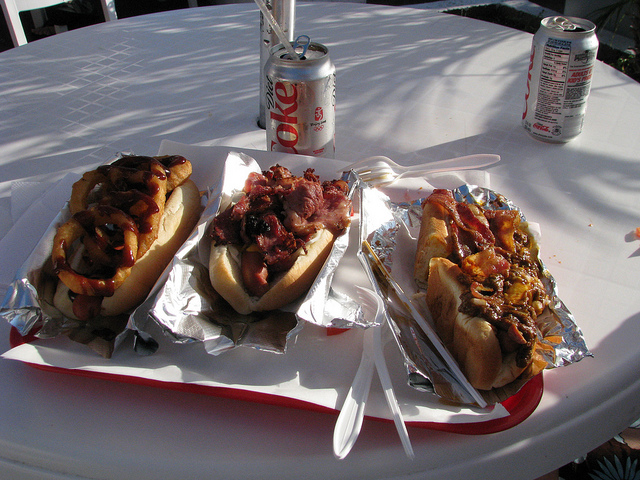

In [7]:
image = data["image"]
image

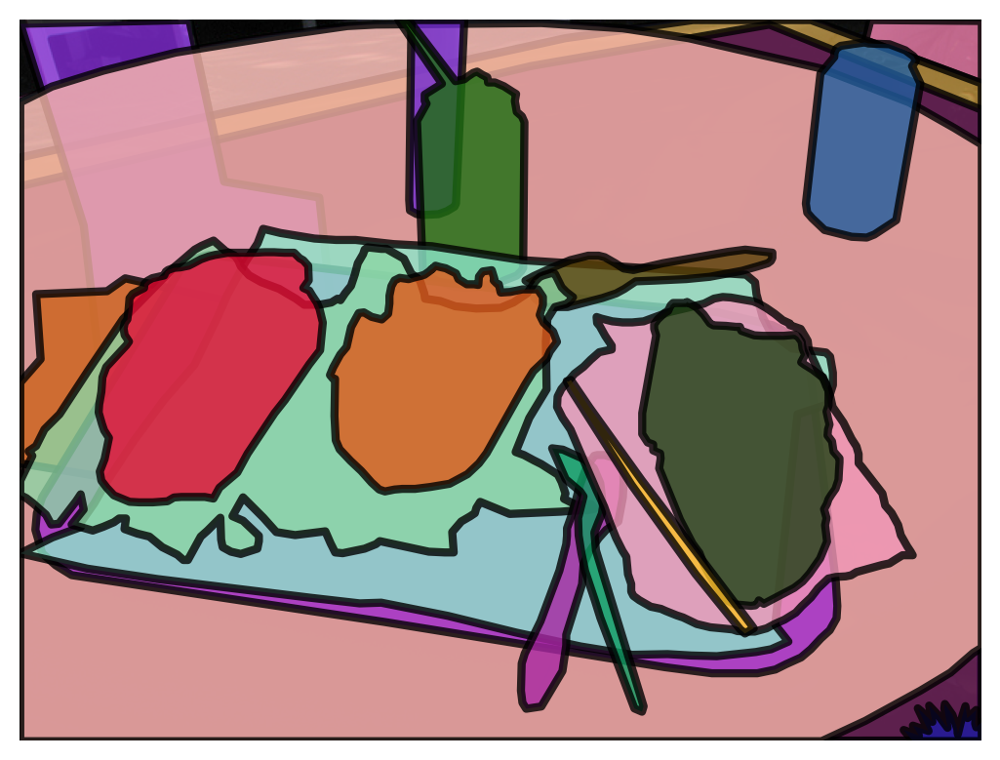

In [8]:
def visualize_amodal_annotation(data, dpi: int = 200):
    fig, ax = plt.subplots(dpi=dpi)
    show_amodal_annotations(data, ax=ax)

visualize_amodal_annotation(data)

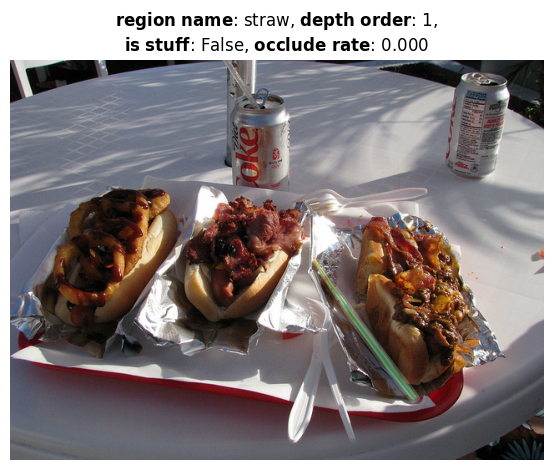

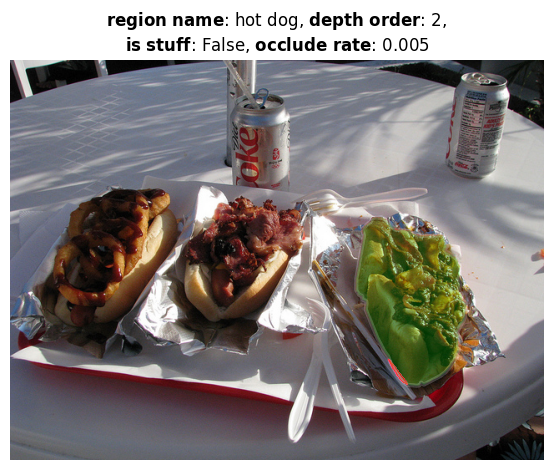

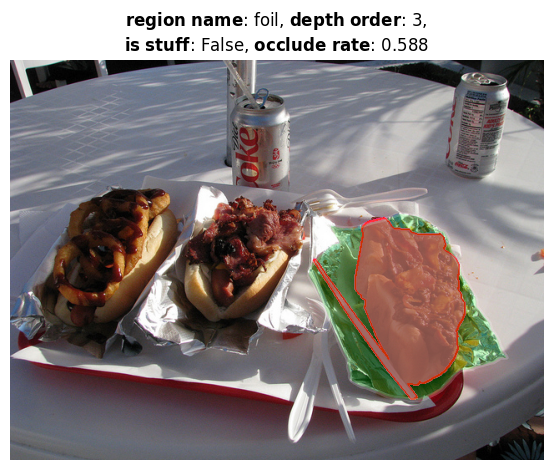

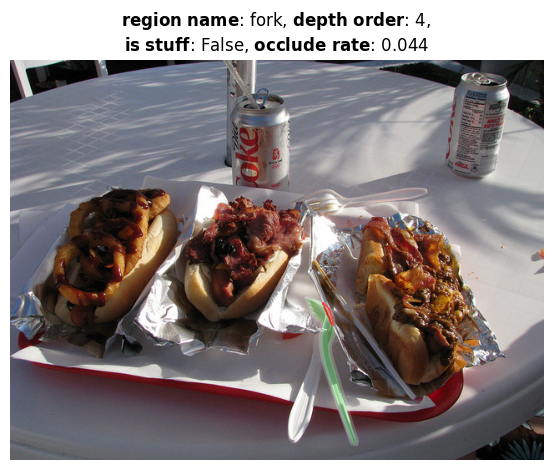

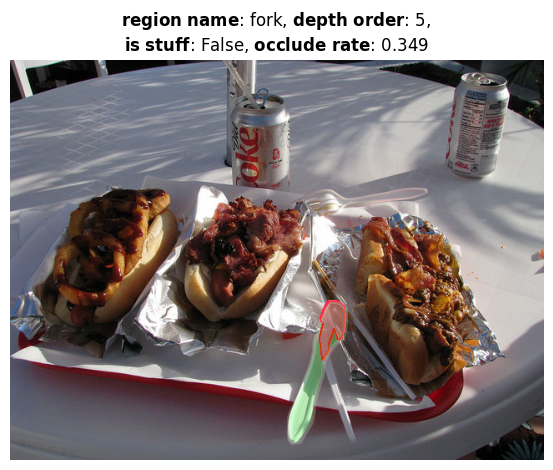

...

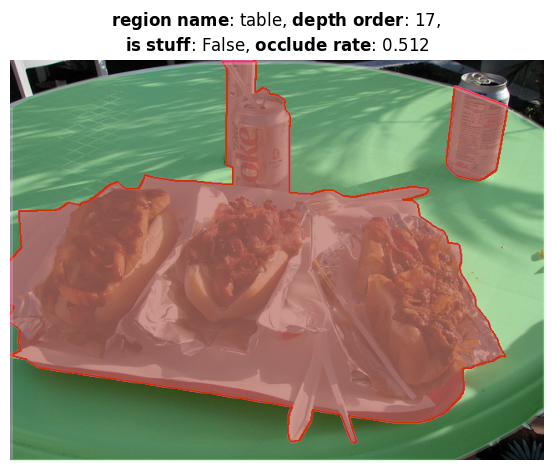

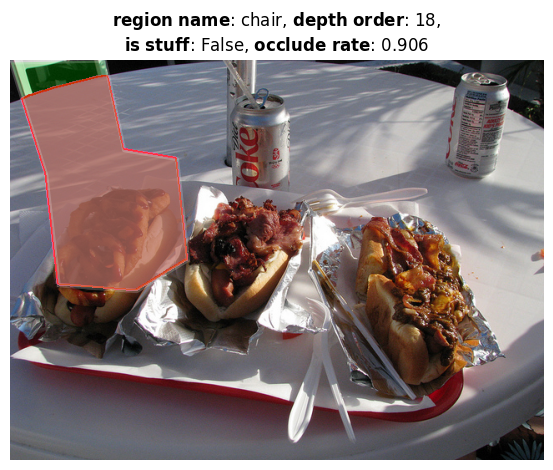

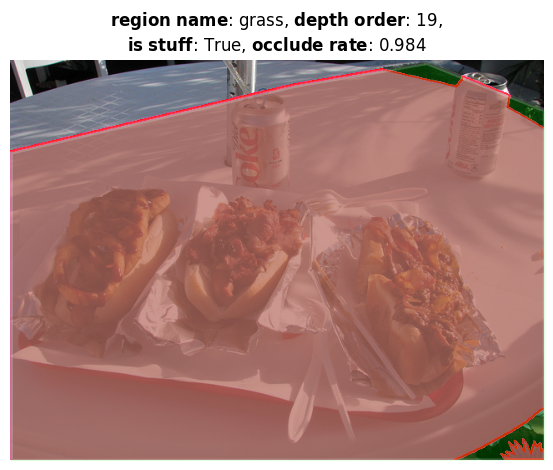

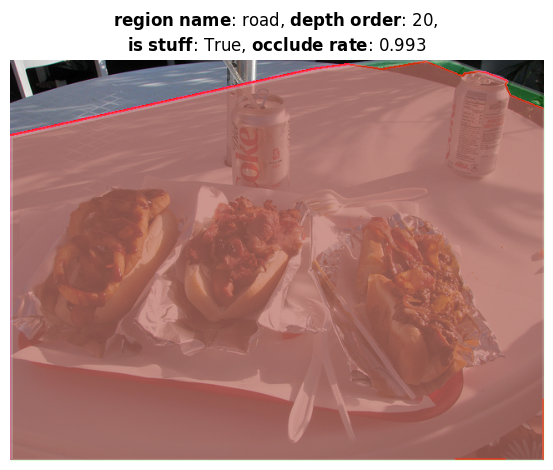

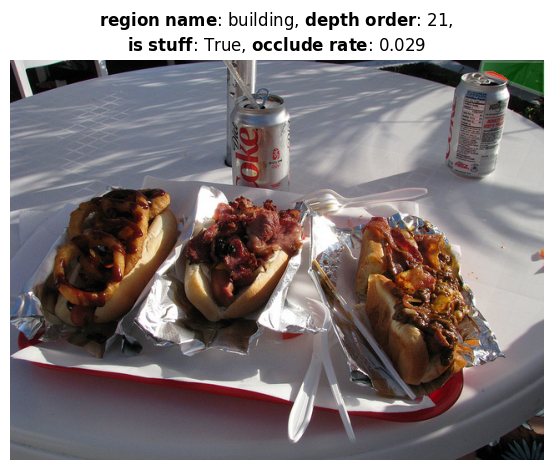

In [9]:
def visualize_amodal_instances(data):
    image = data["image"]
    sizes = data["annotations"]["size"]
    regions = data["annotations"]["regions"]

    assert len(sizes) == len(regions)
    for size, region in zip(sizes, regions):
        for ins in range(size):
            fig, ax = plt.subplots()

            ax.imshow(image)
            ax = show_amodal_instance(data, ax=ax, k=ins + 1)

            name = r"$\bf{region~name}$: " + region["name"][ins]
            depth = r"$\bf{depth~order}$: " + f'{region["order"][ins]}'
            is_stuff = r"$\bf{is~stuff}$: " + f'{region["is_stuff"][ins]}'
            occlude_rate = (
                r"$\bf{occlude~rate}$: " + f"{region['occlude_rate'][ins]:.3f}"
            )

            ax.set_title(f"{name}, {depth}, \n{is_stuff}, {occlude_rate}")

            fig.tight_layout()
            plt.show()
            plt.close()

visualize_amodal_instances(data)